In [4]:
import os

import pandas as pd
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

from sklearn.metrics.pairwise import cosine_similarity

import seaborn as sns

import PIL
from PIL import Image

import cv2
import time

#from deepface import DeepFace
sns.set(style="white")
import time

In [5]:
project_path = r'F:\Codenrock\Kryptonite'
image_path = r'F:\Codenrock\Kryptonite\data\train\images'

### Цветовые фильтры

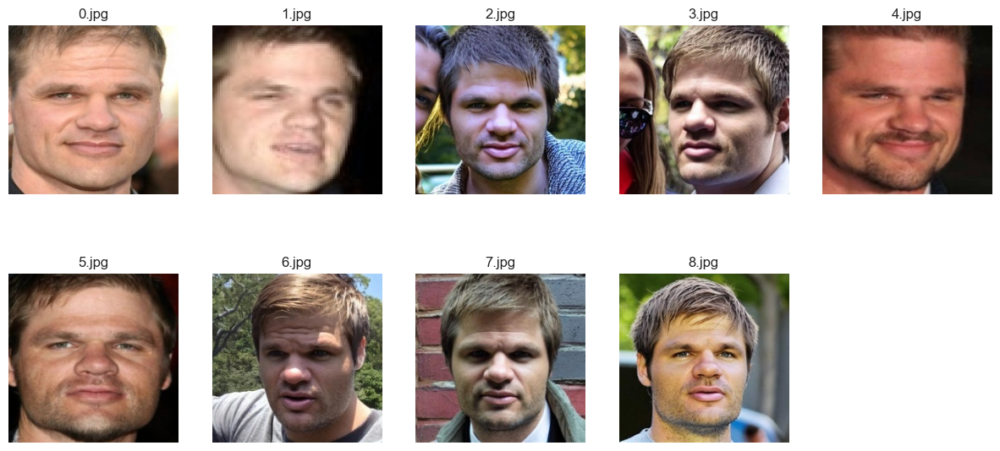

In [274]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

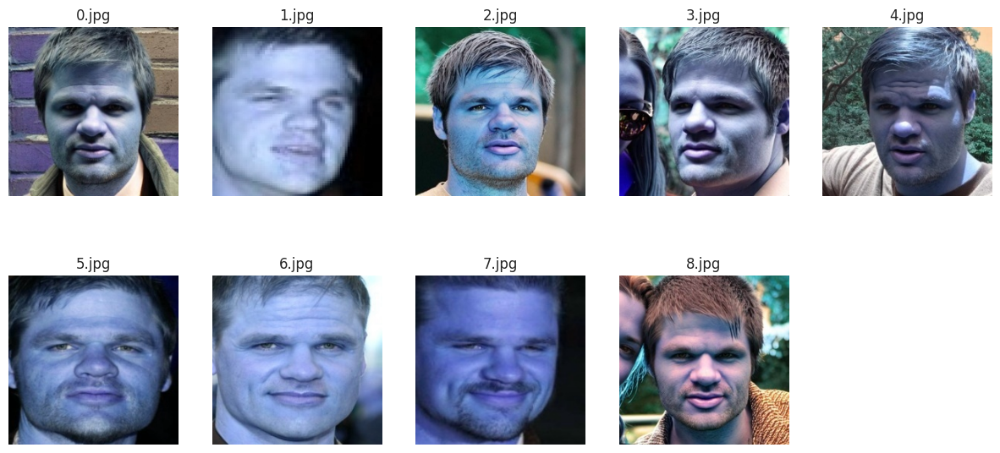

In [53]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

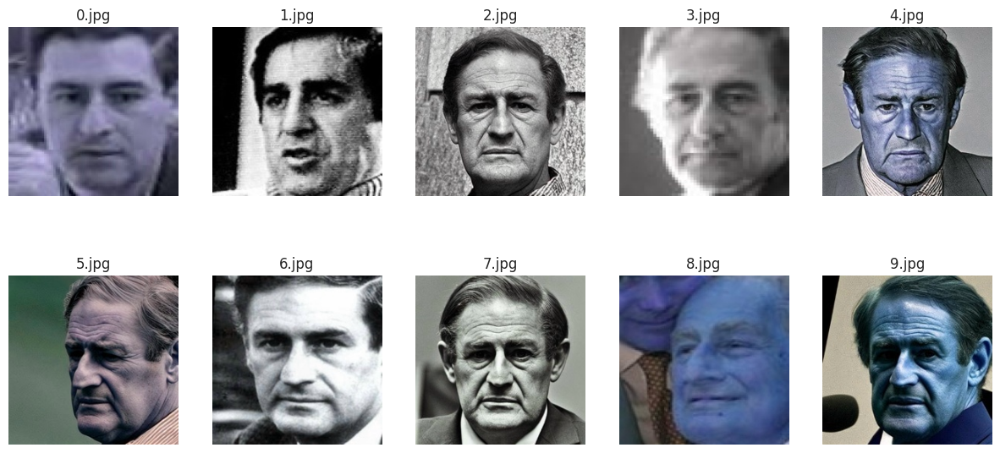

In [55]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

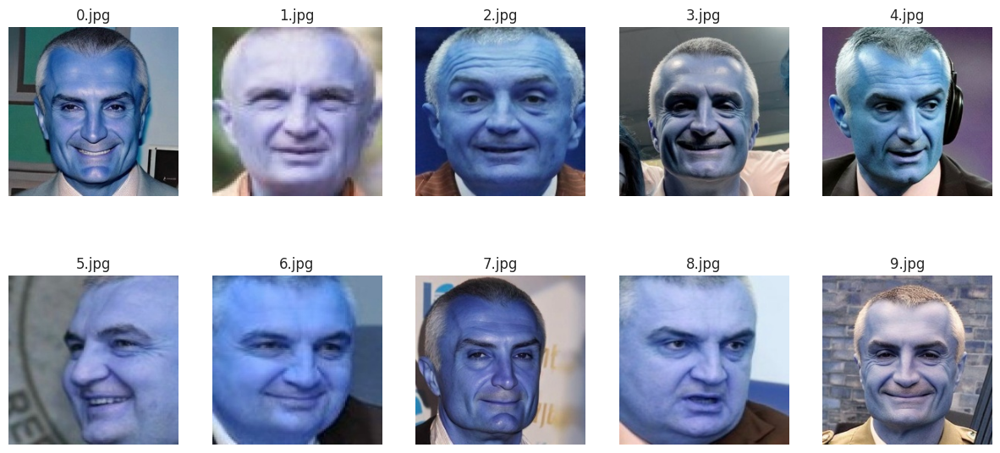

In [57]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000002', os.listdir(os.path.join(image_path, '000002'))[i]))
    #image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

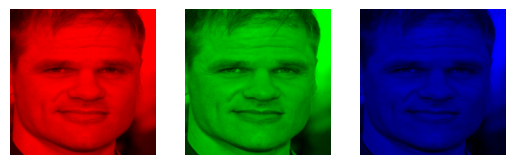

In [49]:
img1 = np.array(Image.open(os.path.join(image_path, '000000', '0.jpg')))
figure, plots = plt.subplots(ncols=3, nrows=1)
for i, subplot in zip(range(3), plots):
    temp = np.zeros(img1.shape, dtype='uint8')
    temp[:,:,i] = img1[:,:,i]
    subplot.imshow(temp)
    subplot.set_axis_off()
plt.show()

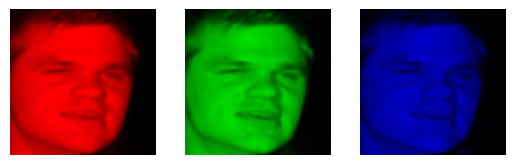

In [50]:
img1 = np.array(Image.open(image_path, os.path.join('000000', '1.jpg')))
figure, plots = plt.subplots(ncols=3, nrows=1)
for i, subplot in zip(range(3), plots):
    temp = np.zeros(img1.shape, dtype='uint8')
    temp[:,:,i] = img1[:,:,i]
    subplot.imshow(temp)
    subplot.set_axis_off()
plt.show()

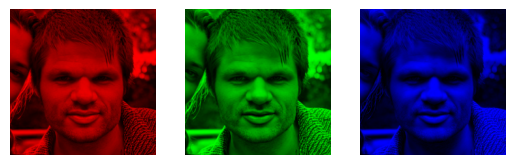

In [51]:
img1 = np.array(Image.open(image_path, os.path.join('000000', '2.jpg')))
figure, plots = plt.subplots(ncols=3, nrows=1)
for i, subplot in zip(range(3), plots):
    temp = np.zeros(img1.shape, dtype='uint8')
    temp[:,:,i] = img1[:,:,i]
    subplot.imshow(temp)
    subplot.set_axis_off()
plt.show()

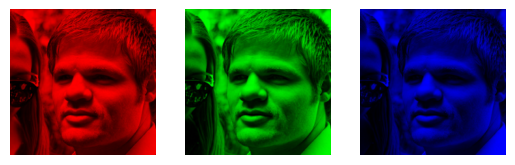

In [52]:
img1 = np.array(Image.open(image_path, os.path.join('000000', '3.jpg')))
figure, plots = plt.subplots(ncols=3, nrows=1)
for i, subplot in zip(range(3), plots):
    temp = np.zeros(img1.shape, dtype='uint8')
    temp[:,:,i] = img1[:,:,i]
    subplot.imshow(temp)
    subplot.set_axis_off()
plt.show()

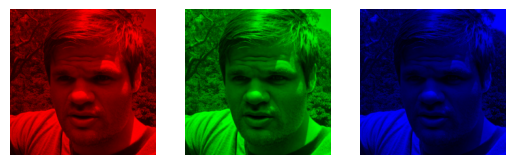

In [56]:
img1 = np.array(Image.open(image_path, os.path.join('000000', '6.jpg')))
figure, plots = plt.subplots(ncols=3, nrows=1)
for i, subplot in zip(range(3), plots):
    temp = np.zeros(img1.shape, dtype='uint8')
    temp[:,:,i] = img1[:,:,i]
    subplot.imshow(temp)
    subplot.set_axis_off()
plt.show()

### Свертки

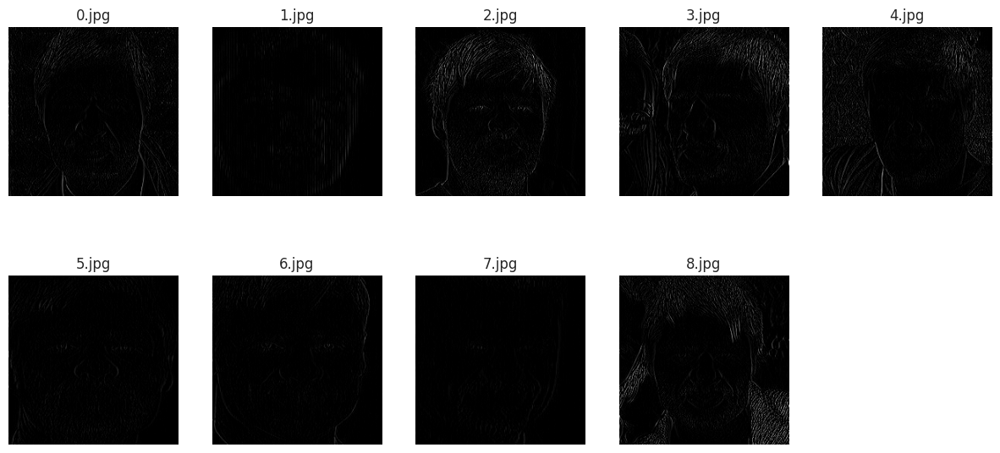

In [69]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 0],
        [1, -2, 1],
        [0, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

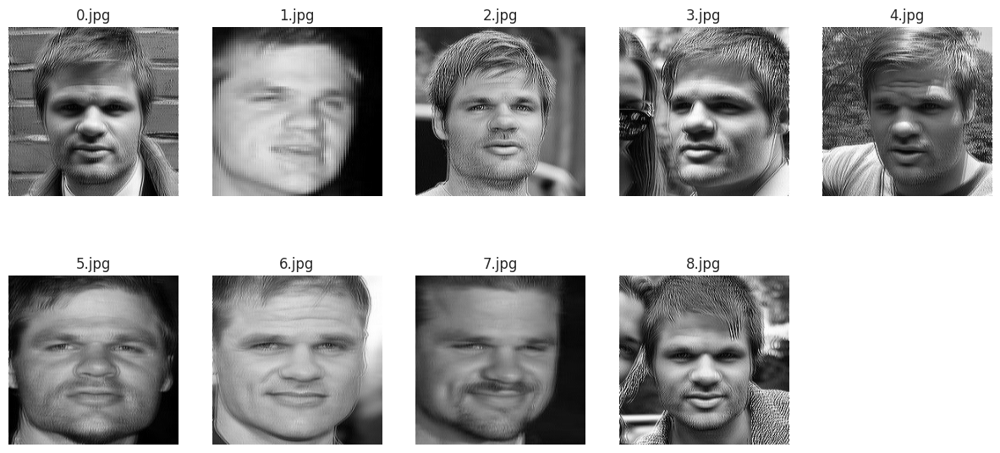

In [70]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 0],
        [2, -3, 2],
        [0, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

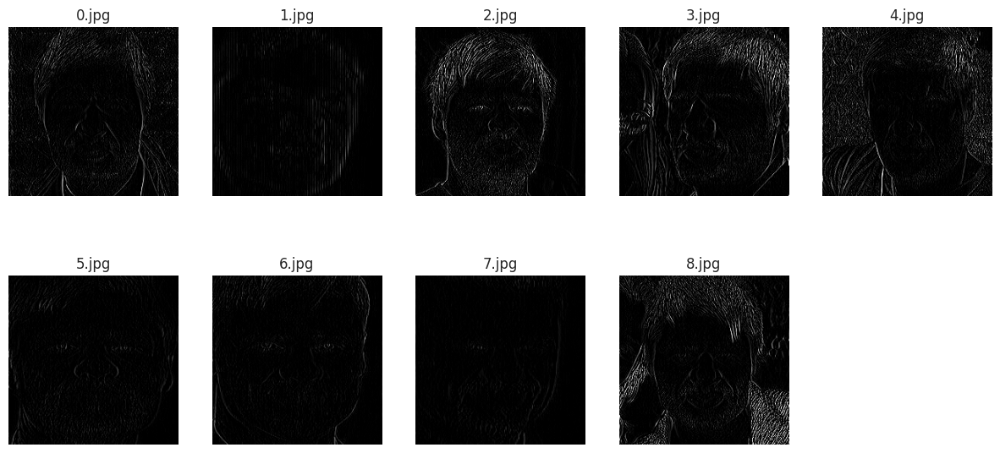

In [72]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 0],
        [2, -4, 2],
        [0, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

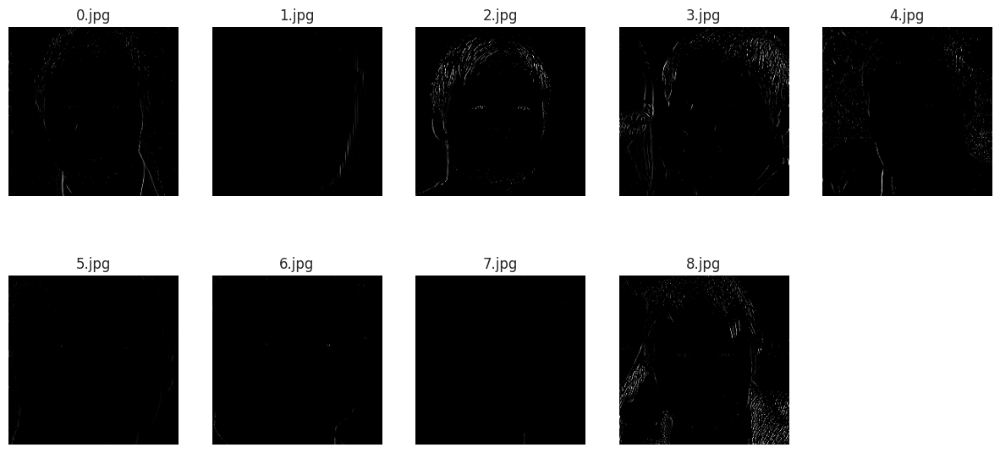

In [74]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 0],
        [2, -5, 2],
        [0, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

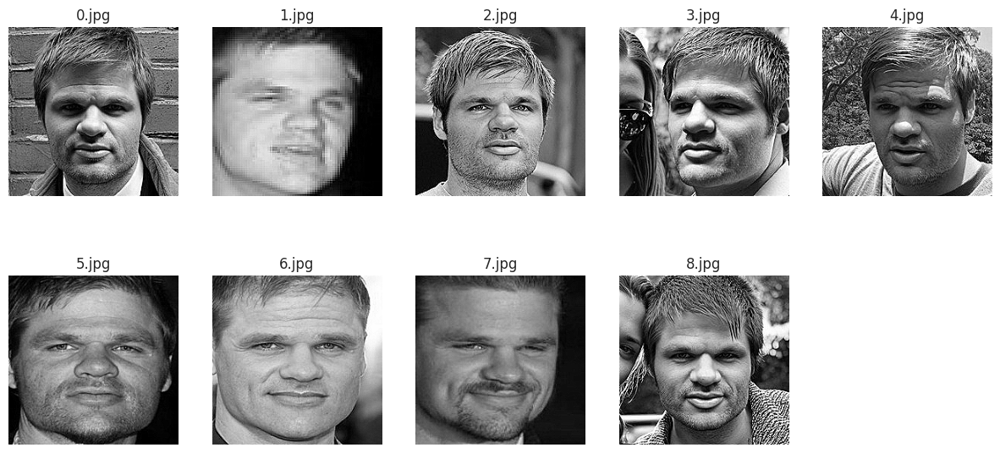

In [75]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

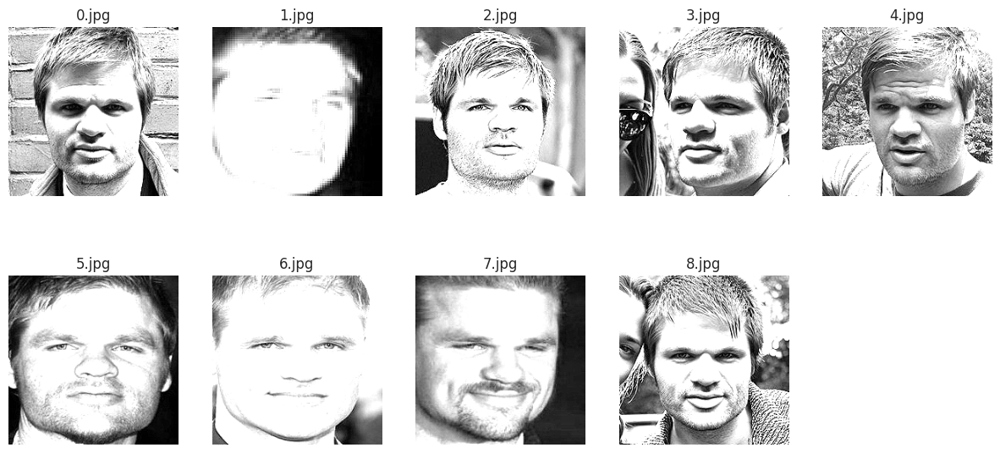

In [77]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, -1, 0],
        [-1, 6, -1],
        [0, -1, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

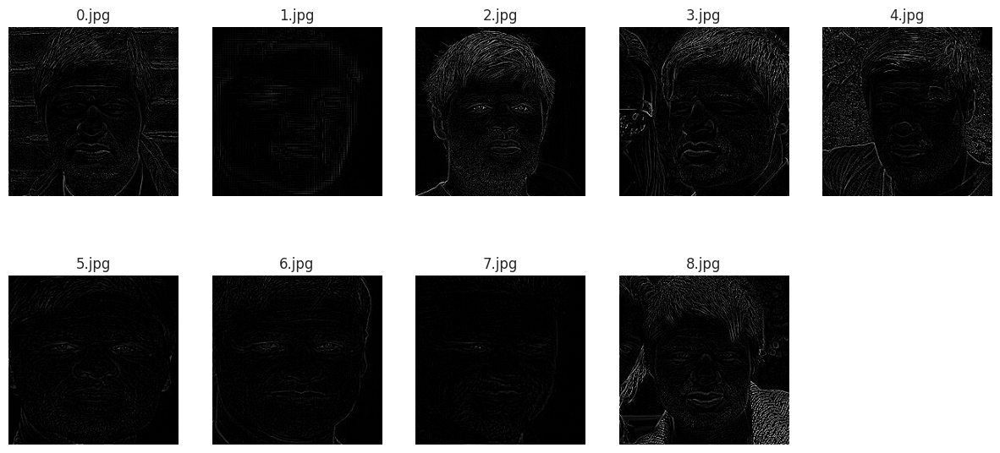

In [79]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, -1, 0],
        [-1, 4, -1],
        [0, -1, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

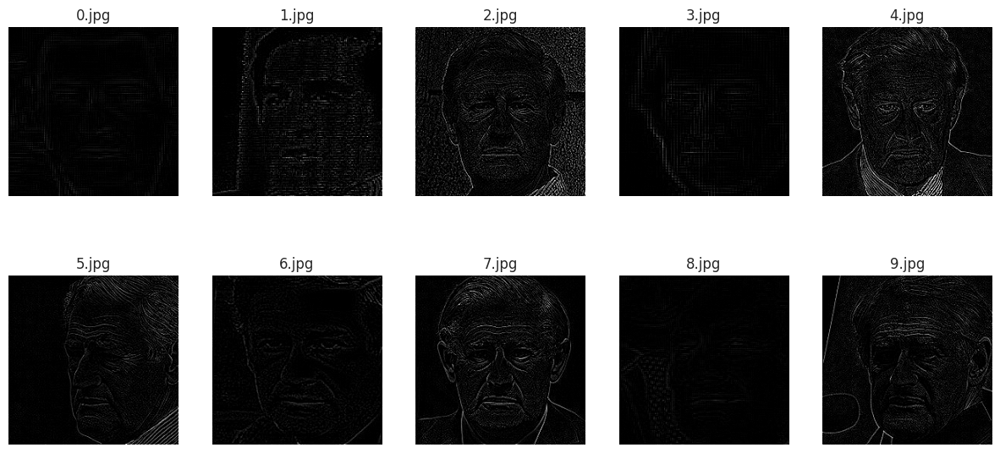

In [80]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, -1, 0],
        [-1, 4, -1],
        [0, -1, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

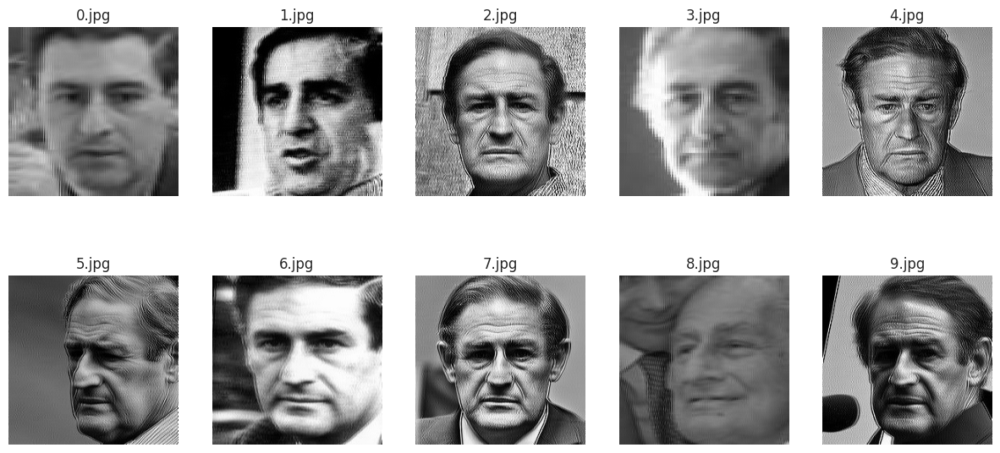

In [81]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 0],
        [2, -3, 2],
        [0, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

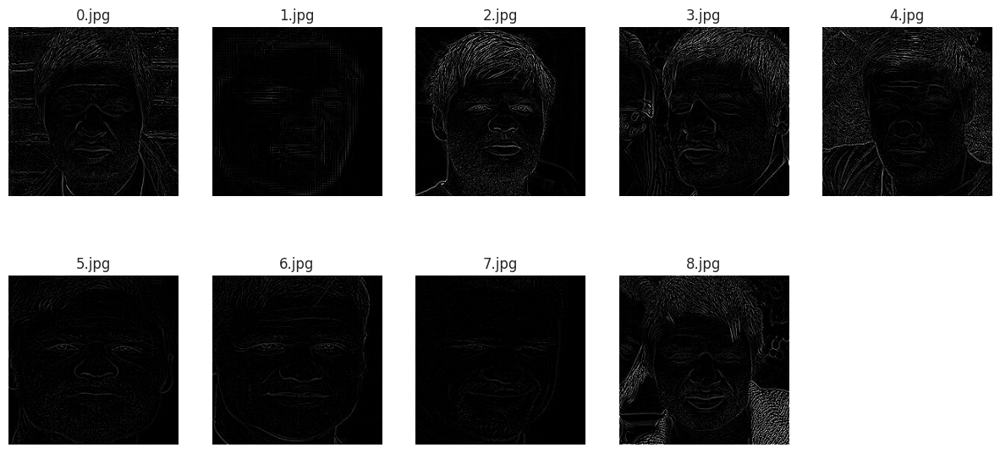

In [84]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 1, 0],
        [1, -4, 1],
        [0, 1, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

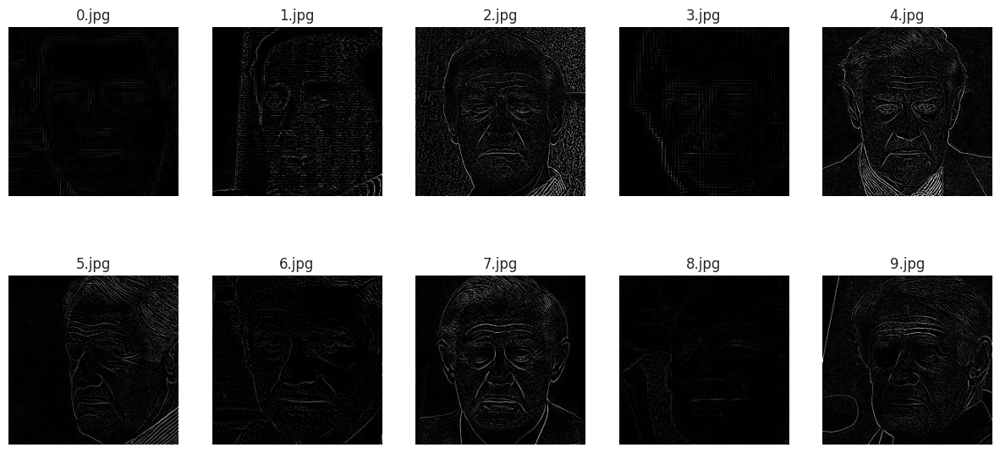

In [85]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 1, 0],
        [1, -4, 1],
        [0, 1, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

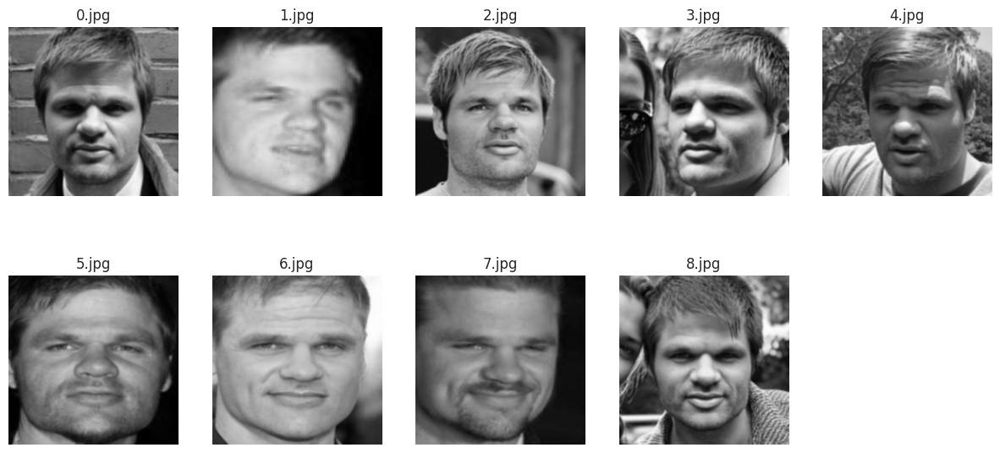

In [86]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0.0625, 0.125, 0.0625],
        [0.125, 0.25, 0.125],
        [0.0625, 0.125, 0.0625]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

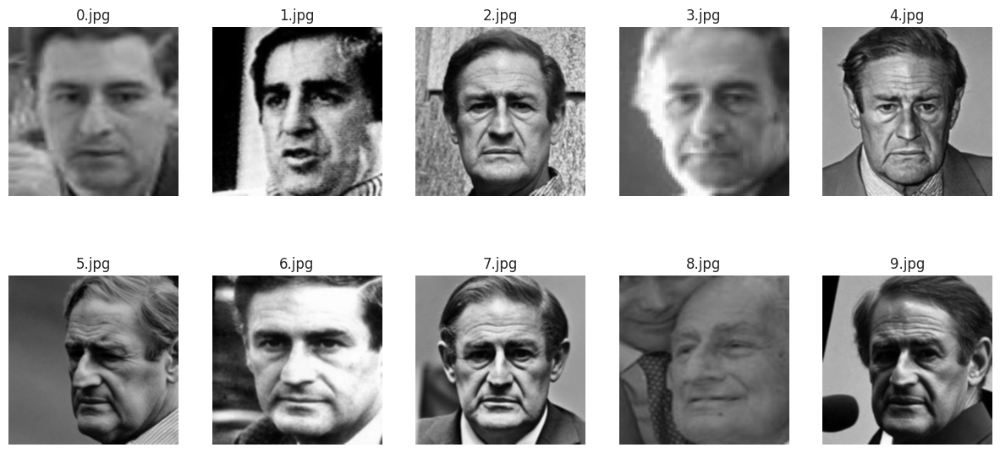

In [87]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0.0625, 0.125, 0.0625],
        [0.125, 0.25, 0.125],
        [0.0625, 0.125, 0.0625]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16796875..8.964844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.0546875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0859375..8.925781].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04296875..8.9296875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2109375..6.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015625..7.375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.296875..8.910156].
Clipp

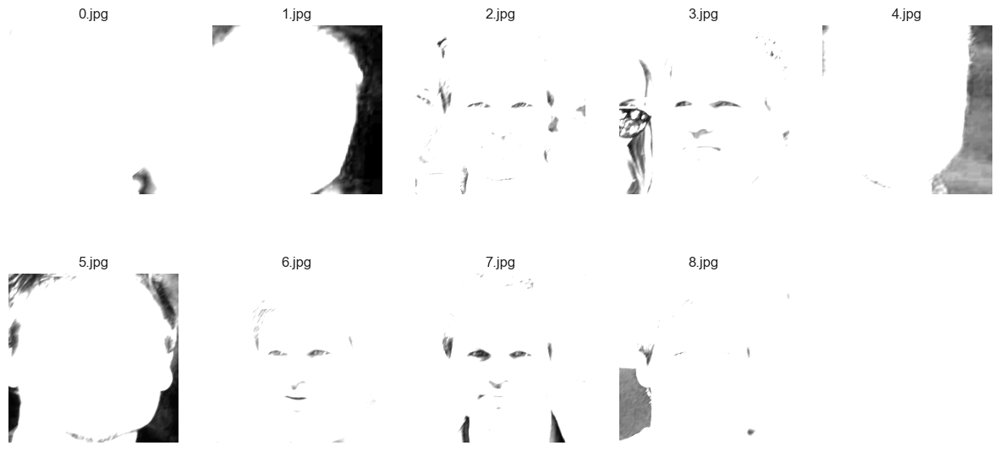

In [17]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 3],
        [0, 3, 0],
        [3, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

### Диагональная свертка 3х3 показала, что при повышении яркости на фэйковых картинках отчетливо видны глаза, в то время, как на настоящих они пропадают вместе с остальными частями лица. Попробуем разные коээфициенты

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.22395833..11.953125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..10.739583].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.114583336..11.901042].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057291668..11.90625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.28125..9.302083].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.020833334..9.833333].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.39583334..11.8802

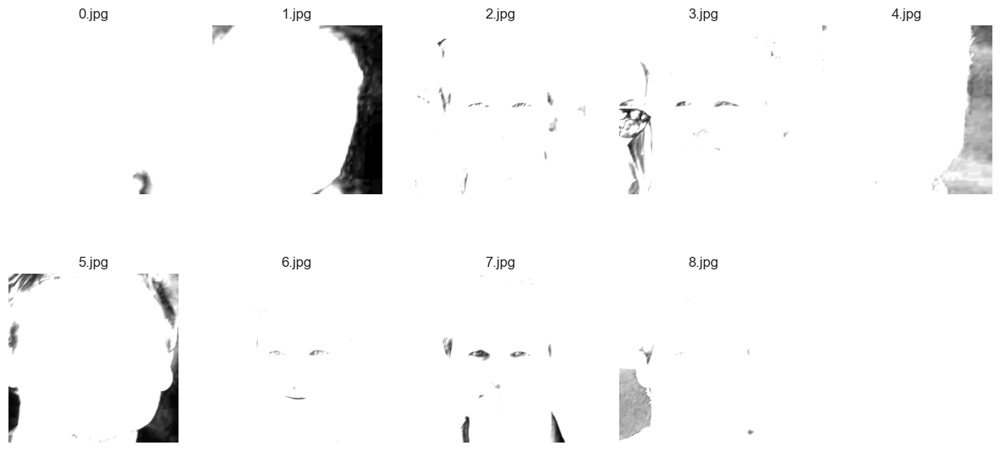

In [19]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 4],
        [0, 4, 0],
        [4, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.111979164..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.3697915].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057291668..5.950521].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028645834..5.953125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.140625..4.6510415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010416667..4.9166665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.19791667..5.94

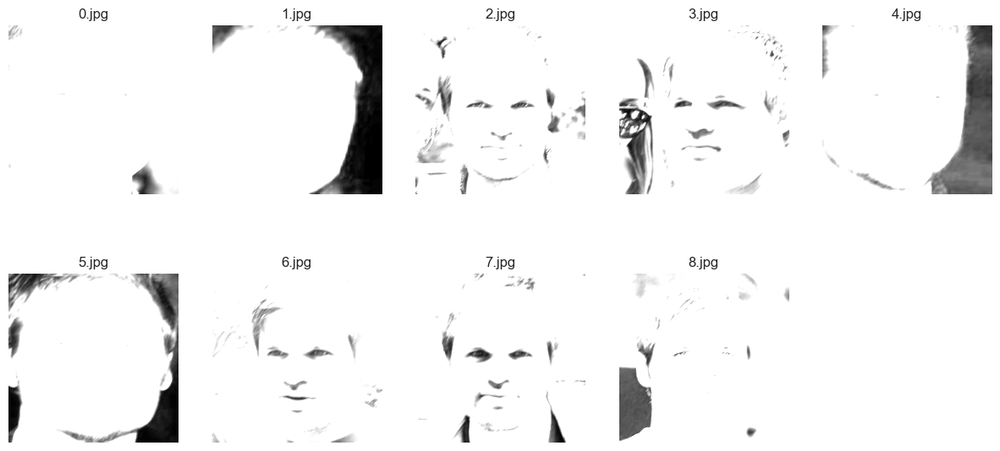

In [21]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.119791664..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.3697915].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036458332..5.9479165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015625..5.9583335].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1484375..4.59375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010416667..4.9166665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16145833..5.9375

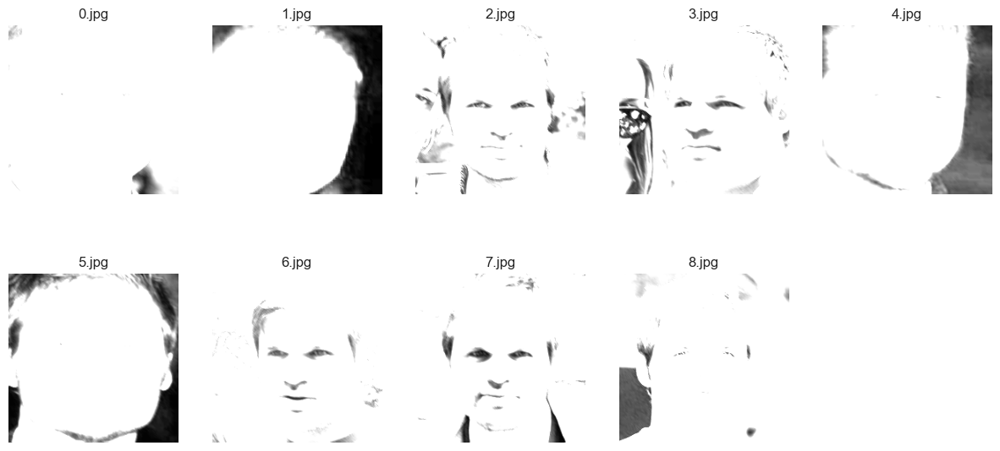

In [23]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [2, 0, 0],
        [0, 2, 0],
        [0, 0, 2]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09765625..4.9804688].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.4700522].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05859375..4.953125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03125..4.9570312].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12109375..3.7916667].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0078125..4.0885415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16276042..4.9166665

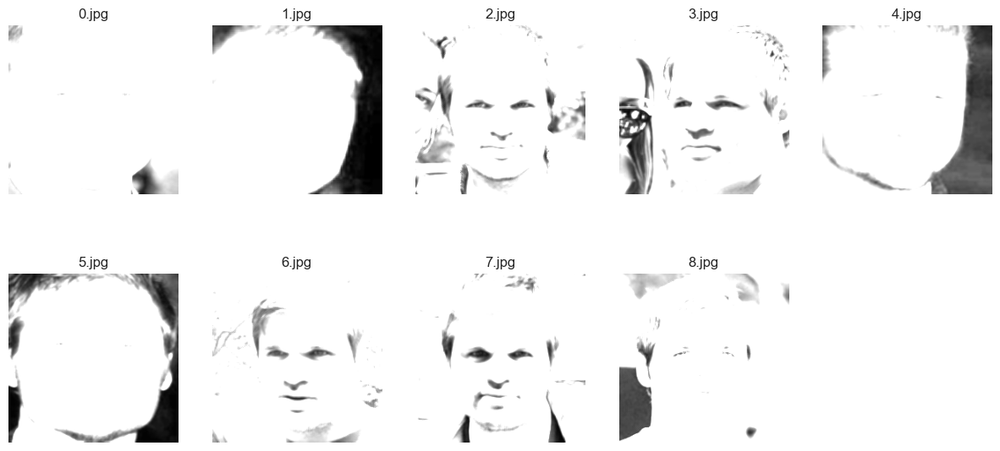

In [33]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000000')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000000', os.listdir(os.path.join(image_path, '000000'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [1, 0, 1],
        [0, 1, 0],
        [1, 0, 1]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.9804688].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.24739583..3.5559895].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.27734375..4.9804688].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0234375..4.8671875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00390625..4.0416665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.055989582..4.6966147].

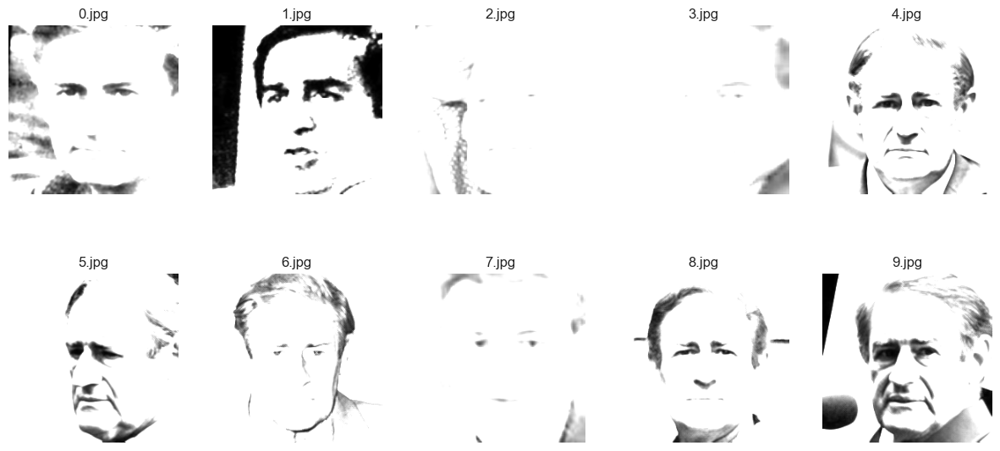

In [35]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [1, 0, 1],
        [0, 1, 0],
        [1, 0, 1]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.27083334..4.2734375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3359375..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.856771].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.5390625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.041666668..5.658854].
Clipping input 

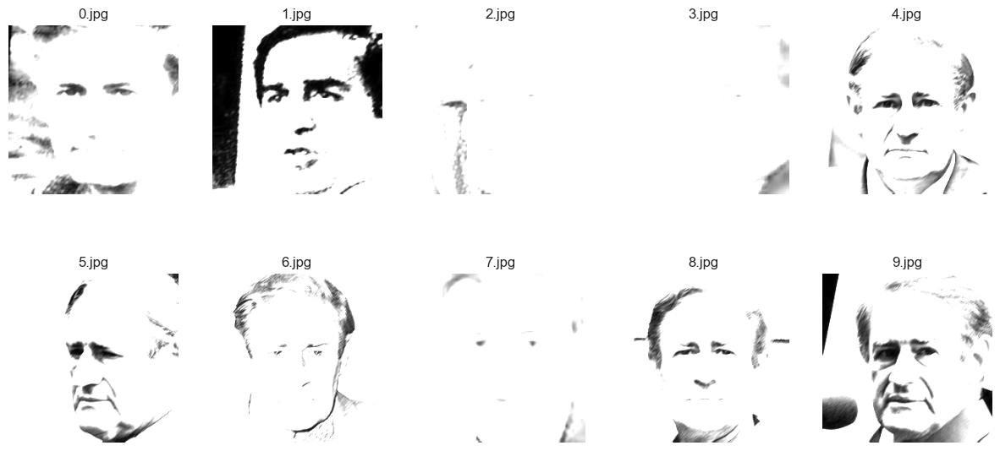

In [37]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.964844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.964844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.40625..6.4101562].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.50390625..8.964844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.785156].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.308594].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0625..8.488281].
Clipping input data to the

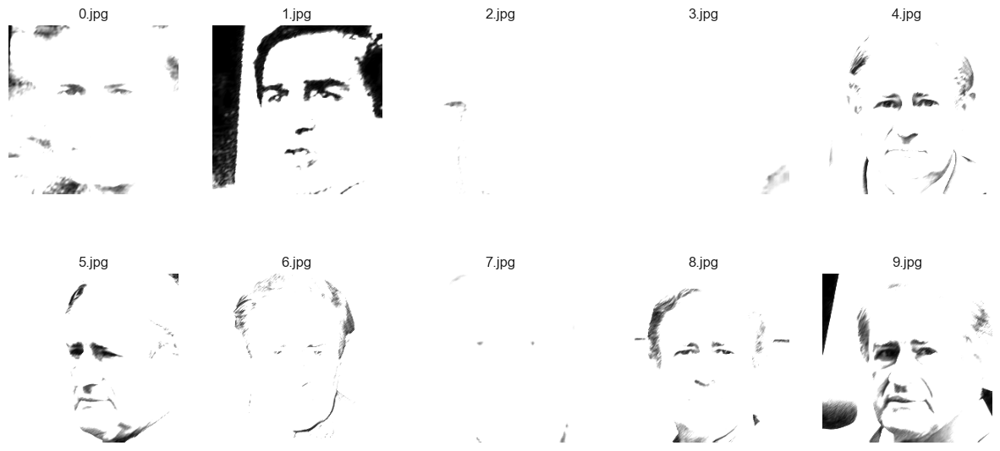

In [39]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 3],
        [0, 3, 0],
        [3, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.953125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.953125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5416667..8.546875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.671875..11.953125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.713542].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.078125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.083333336..11.317708].
Clipping input d

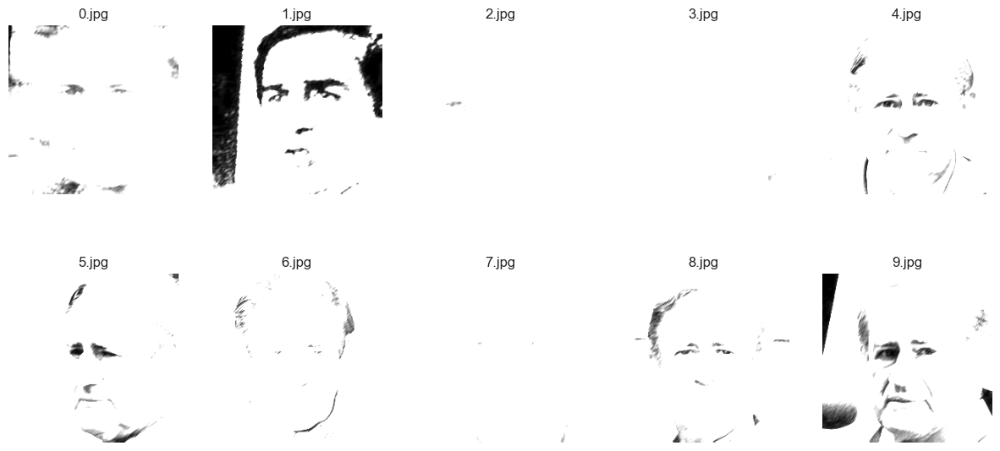

In [41]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000001')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000001', os.listdir(os.path.join(image_path, '000001'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 4],
        [0, 4, 0],
        [4, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.359375..11.171875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.5364584..11.151042].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.42708334..10.984375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.479167].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.7552083..10.760417].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.859375..9.322917].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.71875].
Clippin

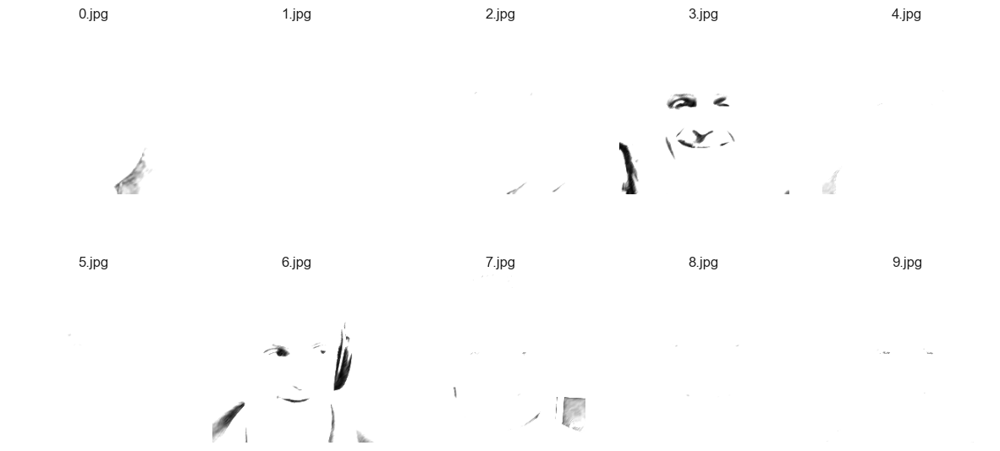

In [43]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000002')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000002', os.listdir(os.path.join(image_path, '000002'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 4],
        [0, 4, 0],
        [4, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.26953125..8.378906].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.1523438..8.363281].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3203125..8.238281].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.609375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.56640625..8.0703125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.64453125..6.9921875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.7890625].
Clipp

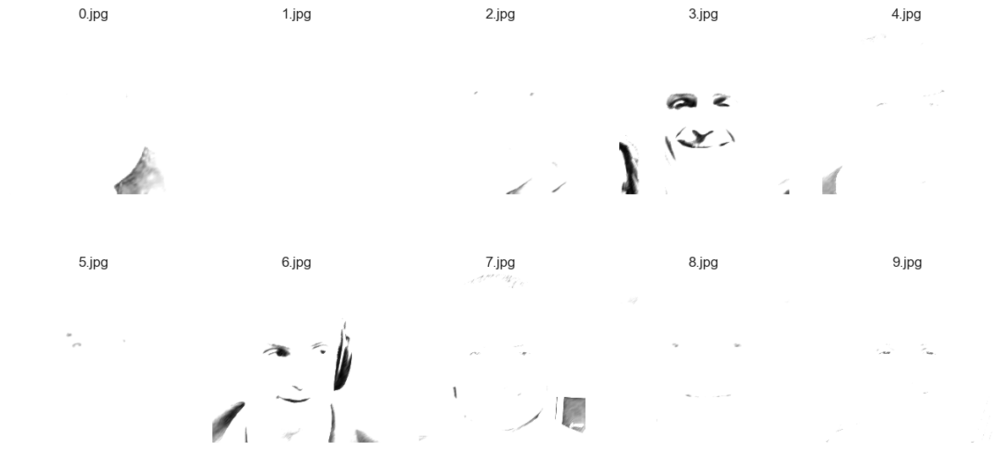

In [45]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000002')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000002', os.listdir(os.path.join(image_path, '000002'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 3],
        [0, 3, 0],
        [3, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1796875..5.5859375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.7682292..5.575521].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.21354167..5.4921875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.7395835].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.37760416..5.3802085].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4296875..4.6614585].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.859375].
Clip

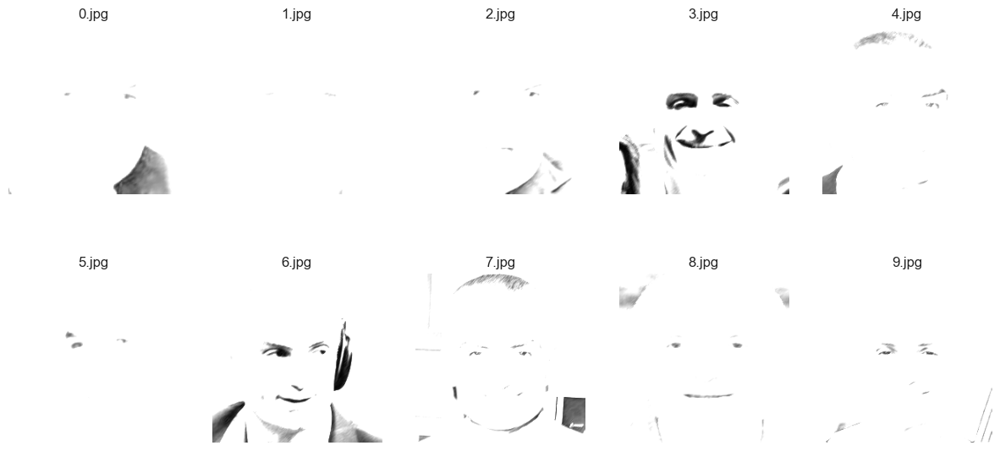

In [47]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000002')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000002', os.listdir(os.path.join(image_path, '000002'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.29947916..5.9270835].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.30729166..5.705729].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.8020833..5.9635415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6744792..5.125].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.36979166..5.9375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0078125..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.106770836..5.94791

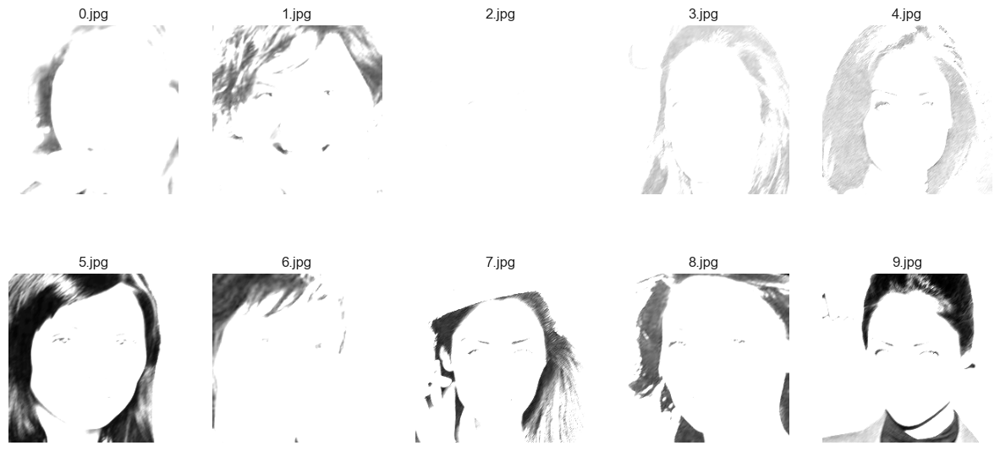

In [49]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000003')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000003', os.listdir(os.path.join(image_path, '000003'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

In [ ]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000003')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000003', os.listdir(os.path.join(image_path, '000003'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.2890625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.26041666..5.205729].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2890625..5.4921875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0625..5.546875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.018229166..4.6041665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.17708333..5.9635415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.71875..5.9375].
Clip

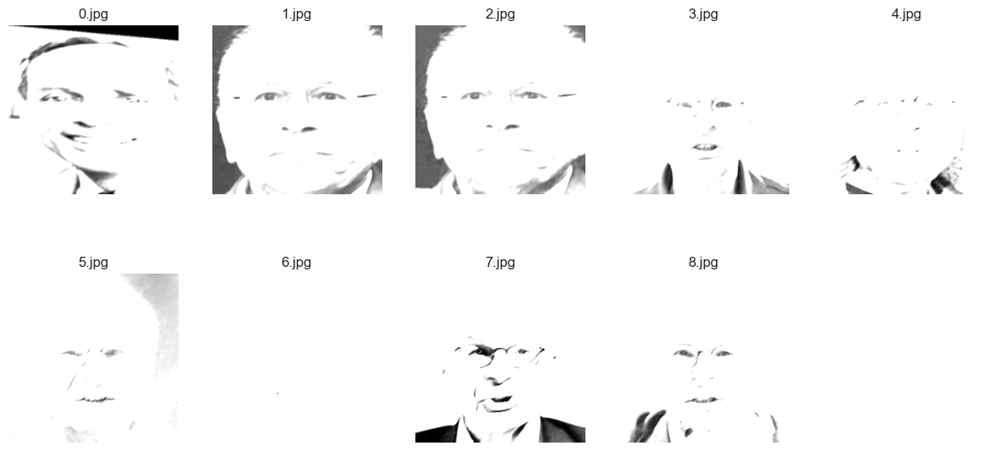

In [51]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000004')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000004', os.listdir(os.path.join(image_path, '000004'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.684896].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.390625..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.036458332..5.65625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6848958..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6536458..5.71875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3515625..5.9375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03125..5.955729].
Clipping

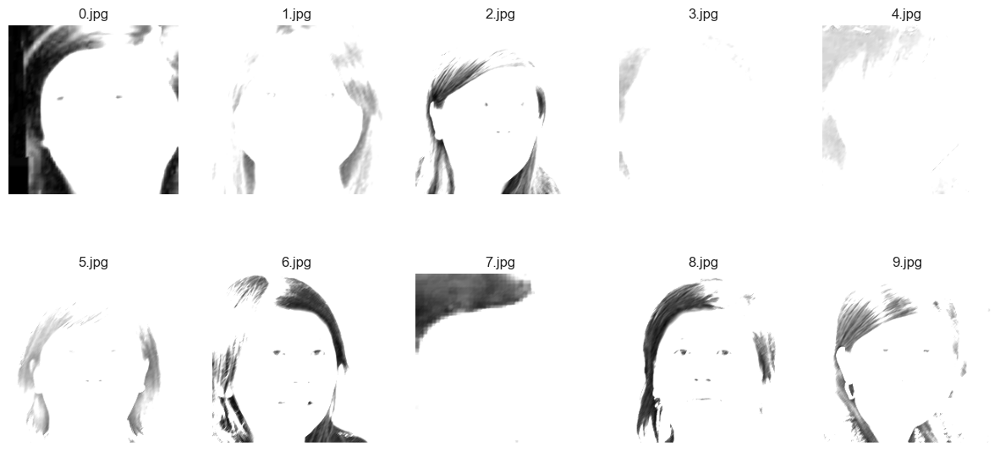

In [53]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000005')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000005', os.listdir(os.path.join(image_path, '000005'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.018229166..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.15104167..5.075521].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.018229166..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0703125..5.653646].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.13802083..5.5364585].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0390625..5.8229165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.088541664

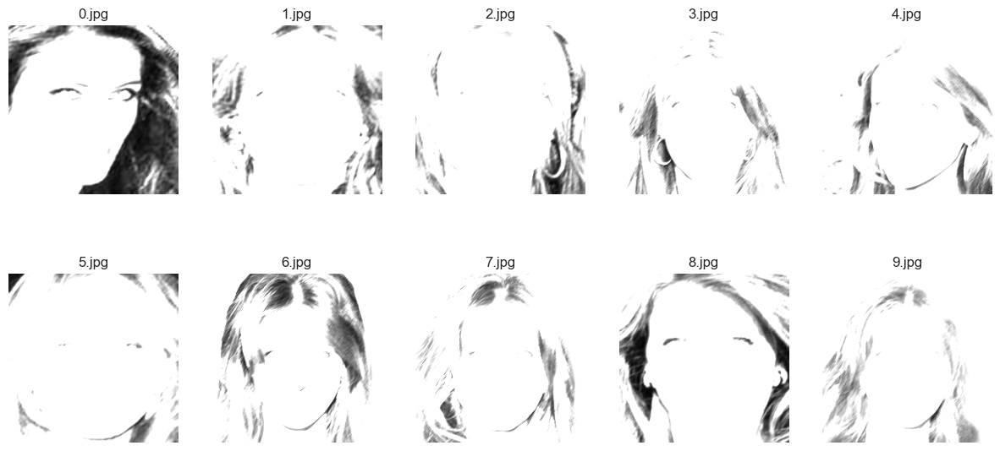

In [55]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000006')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000006', os.listdir(os.path.join(image_path, '000006'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.009114583..2.9882812].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.075520836..2.5377605].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.009114583..2.9882812].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03515625..2.826823].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.069010414..2.7682292].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.01953125..2.9114583].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0442

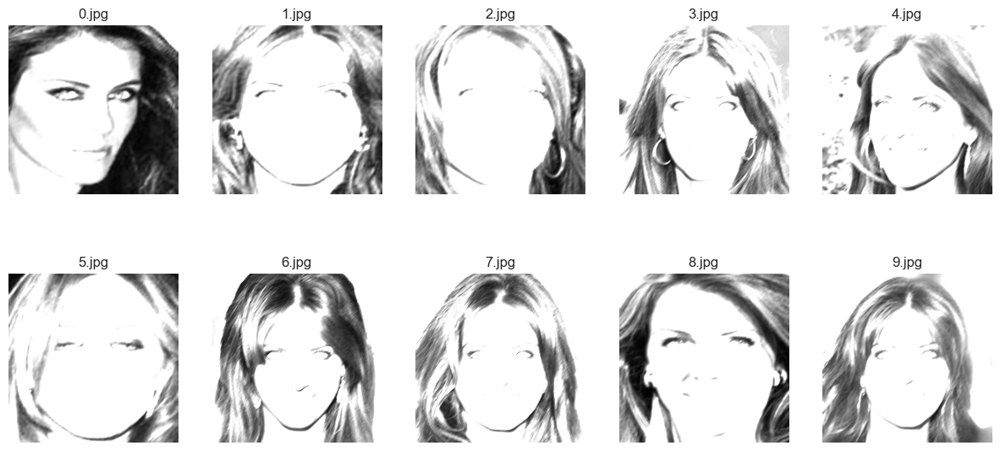

In [8]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000006')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000006', os.listdir(os.path.join(image_path, '000006'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 1],
        [0, 1, 0],
        [1, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.421875..5.325521].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.34375..5.9140625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0078125..5.359375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.6614585].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1171875..5.7734375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.041666668..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.9140625].
Clippin

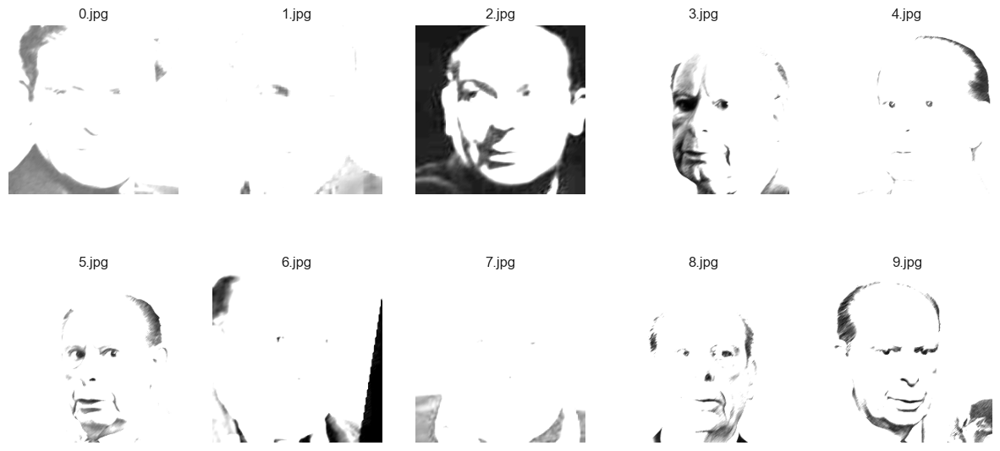

In [57]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000007')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000007', os.listdir(os.path.join(image_path, '000007'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.390625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6848958..5.2890625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010416667..5.4270835].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0390625..5.7552085].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.7447915].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0234375..5.440104].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0390625..5.8854165].
Clip

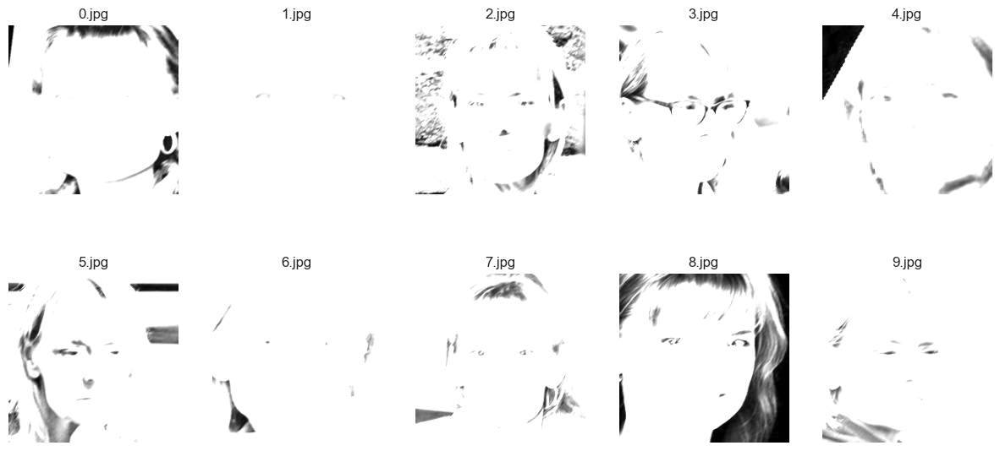

In [59]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000008')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000008', os.listdir(os.path.join(image_path, '000008'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0625..4.765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010416667..5.4635415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0078125..5.40625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1796875..5.315104].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.096354164..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.9635415].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5598958..5.966146].
Cl

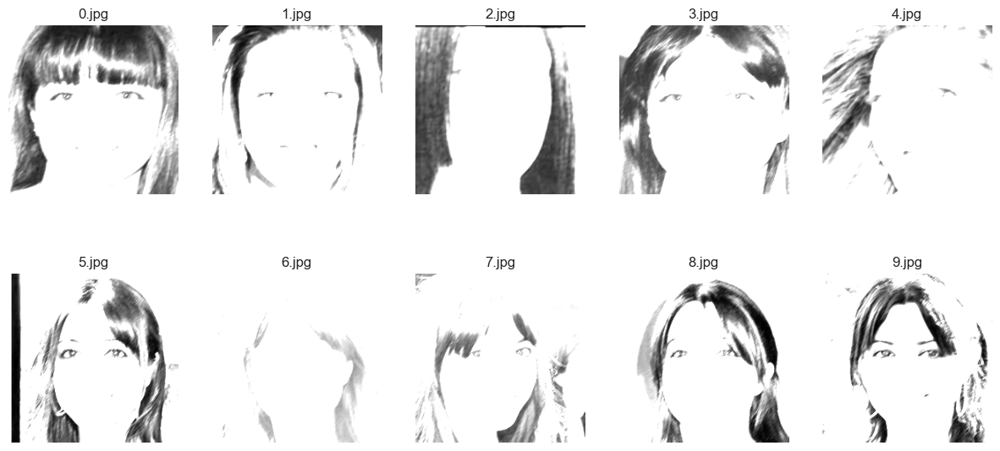

In [63]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000009')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000009', os.listdir(os.path.join(image_path, '000009'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5130208..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.796875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.106770836..3.65625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.015625..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.9765625].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.2734375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0234375..5.044271].
Clipping inpu

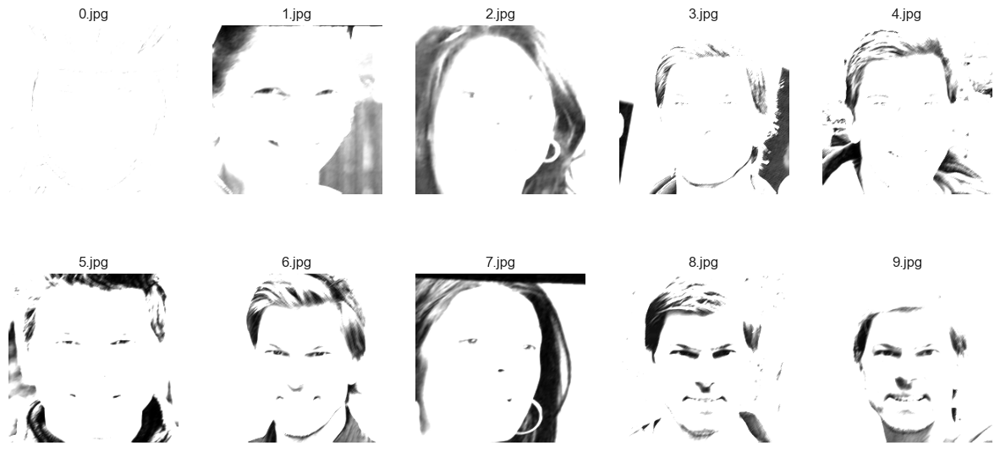

In [71]:
fig = plt.figure(figsize=(15, 7))
for i in range(len(os.listdir(os.path.join(image_path, '000010')))):
    num = i+1
    plt.subplot(2, 5, num)
    image = cv2.imread(os.path.join(image_path, '000010', os.listdir(os.path.join(image_path, '000010'))[i]))
    RGB_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    img_t = torch.from_numpy(RGB_img).type(torch.float32).unsqueeze(0)
    kernel = torch.tensor([
        [0, 0, 2],
        [0, 2, 0],
        [2, 0, 0]
    ]).reshape(1, 1, 3, 3).type(torch.float32)

    kernel = kernel.repeat(3, 3, 1, 1)
    img_t = img_t.permute(0, 3, 1, 2)  # [BS, H, W, C] -> [BS, C, H, W]
    img_t = nn.ReflectionPad2d(1)(img_t)  # Pad Image for same output size

    result = F.conv2d(img_t, kernel)[0]  #
    result_np = result.permute(1, 2, 0).numpy() / 256 / 3

    plt.imshow(result_np)
    plt.axis('off')  # Hide the axis labels
    plt.title(f"{i}.jpg")

### В зависимости от собственной яркости и экспозиции фото, где-то нужен совсем небольшой коэффициент в свертке (1-2), где-то лучше видно артефакт глаз при коэффициенте 4. 
### Некоторые группы фотографий (например, id 000002 и 000006) "засвечивались" полностью с той сверткой, вероятно, имела место какая-то предварительная обработка фото.
### Оптимальным коэффициентом для диагональной свертки на большинстве фото кажется 2:
[0, 0, 2],

[0, 2, 0],

[2, 0, 0]

### Но требуются дополнительные эксперименты для уточнения коэффициента и разработки возможностей применения этого метода. 